In [2]:
from matplotlib import style
from matplotlib.animation import FuncAnimation
from IPython import display
import nm_lib as nm
#style.use('dark_background')
import importlib
importlib.reload(nm)

#%matplotlib ipympl

<module 'nm_lib' from '/Users/gauteholen/UiO/AST9110/nm_lib/nm_lib/__init__.py'>

# A first example of a numerical simulation

In this exercise, you will conduct a first instance of numerical simulation of the time evolution of a system. We will solve an advection equation of the form

$$\frac{\partial u}{\partial t} + a \frac{\partial u}{\partial x} = 0  \tag{1}$$

with $a$ being a __constant__. In subsequent exercises, more general cases will be considered, with $a$ no longer constant.

## 1 – The $a = const$ case: the mathematical problem

We would like to solve equation (1) numerically for $x  [x_0, x_f]$ with $x_0 = −2.6$, $x_f = 2.6$, periodic boundary conditions and with the initial condition:

$$u(x,t=t_0) = \cos^2 \left(\frac{6 \pi x}{5} \right) / \cosh(5x^2) \tag{2}$$

We start by representing that function in the given interval.

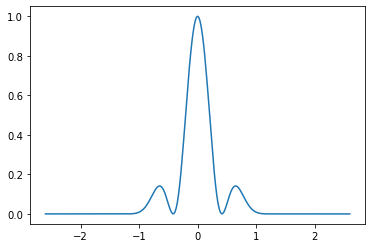

In [4]:
import numpy as np
import matplotlib.pyplot as plt

x0 = -2.6
xf = 2.6
nump = 256

def u_x_t0(xx):
    return np.ma.cos(0.2*6*np.pi*xx)**2/np.cosh(5*xx*xx)

xx = np.linspace(x0,xf,nump+1)
ux_t0 = u_x_t0(xx)

plt.plot(xx,ux_t0)

## 2 – Spatial derivative.

We discretize the initial condition by subdividing the spatial domain into $nint=64$ equal intervals. The function will therefore be sampled with $nump=65$ points, namely $(u_0, u_1, u_2, ... , u_{nump−1})$ at equidistant values of the abscissa, $(x_0, x_1, x_2, ..., x_{nump−1})$. Let us calculate the spatial derivative of the function through non-centered finite differences of the form:

$$\left(\frac{\partial u}{\partial x}\right)_{x=x_i} \rightarrow \frac{u_{i+1}-u_{i}}{\Delta x}  \tag{3}$$

On the basis of the experience gained with the previous batch of exercises (ex. 1), which order of approximation can we expect now for the calculation of the derivative since we are using non-centered finite differences?

Answer: non-centered finite difference has 1st order approximation of error $\Delta x ^1$

## 3 – Time advance.

We want to calculate an approximation to the value of the function at times later than $t = t_0$, for instance, at time $t_0 + \Delta t$. To that end, we carry out a discretization of the time axis, calculating approximate values for the time derivative as follows:

$$\left(\frac{\partial u}{\partial t}\right)_{\underset{t=t_0}{x=x_i}} \rightarrow \frac{u_i(t_0 + \Delta t)-u_i(t_0)}{\Delta t}\tag{4}$$

Using now the differential equation (1) and expression (3), we can calculate an approximate value for the function $u$ at $x_i$ and time $t_0 + \Delta t$ as follows:

$$u_i(t_0+\Delta t) = u_i(t_0) - a \frac{u_{i+1}(t_0) - u_i(t_0)}{\Delta x}\Delta t  \tag{5}$$

Using (5), calculate $u_i$ at time $t_0 + \Delta t$ at all points of the sample excluding the rightmost point (i.e., excluding $x_{nump−1}$). Use  $\Delta t = 0.98 \Delta x/|a|$ and a = −1. Fill in `nm_lib` the functions `step_adv_burgers` and `cfl_adv_burger`. 

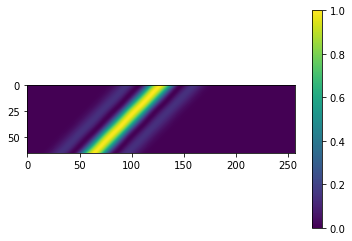

In [7]:
#import nm_lib as nm

Nt = 64
tt = np.linspace(0,Nt,Nt+1)
a = -1
u0 = ux_t0

ut = [ux_t0]
u = u0
for t in tt:
    dt,u_next = nm.step_adv_burgers(xx,u,a,ddx=nm.deriv_dnw)
    u_next[-1] = u_next[0]
    ut.append(u_next)
    u = u_next

#fig, ax = plt.subplots(subplot_kw={"projection" : "3d"})

#ax.plot_surface(xx,tt,ut)
plt.figure()
plt.imshow(ut)
plt.colorbar()

<span style="color:green">JMS</span>.

<span style="color:red">Now I get an error tuple: 

        10 for t in tt:
        11     u_next = nm.step_adv_burgers(xx,u,a,ddx=nm.deriv_dnw)
    ---> 12     u_next[-1] = u_next[0]
        13     ut.append(u_next)
        14     u = u_next

    TypeError: 'tuple' object does not support item assignment
 </span>.


## 4 – The boundaries.

To calculate the function at the rightmost point of the interval, we use a periodicity condition on $u$: $u_{nump−1}(t_0 + \Delta t) = u_0(t_0 + \Delta t)$. Consider cutting the ill-calculated (or missing) grid points and using `NumPy.pad` to add different boundary conditions. Use `wrap`

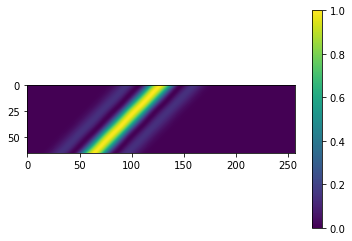

In [5]:
ut = [ux_t0]
u = u0
for t in tt:
    dt,u_next = nm.step_adv_burgers(xx,u,a,ddx=nm.deriv_dnw)
    u_next = np.pad(u_next[1:-1],(1,1),"wrap")
    ut.append(u_next)
    u = u_next

#fig, ax = plt.subplots(subplot_kw={"projection" : "3d"})

#ax.plot_surface(xx,tt,ut)
plt.figure()
plt.imshow(ut)
plt.colorbar()

## 5 – Subsequent steps in time.

Having calculated the values $u_i$, $i = 0, 1, 2, ...,nump−1,$ at time $t_0+\Delta t$, we can carry out another step in time of size $\Delta t$, following exactly the method just explained. In general, if we have calculated the value of the $u$ function at $x_i$ and time $n\Delta t$, which we will call $u^n_i$, we can carry out the next step in time, of size $\Delta t$, through the expression:

$$u_i^{n+1} = u_i^n - a \frac{u_{i+1}^n - u_i^n}{\Delta x}\Delta t  \tag{6}$$

Periodic boundary conditions must be applied, as explained in 4 above, to finish the calculation at each timestep. Fill in nm_lib the function `evolv_adv_burgers`. 

Carry out many steps in time so you can clearly understand the mathematical nature of the solution of the equation. For example, in Python, you can _matplotlib.animation_ to see the evolution. 

In [9]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
importlib.reload(nm)

x0 = -2.6
xf = 2.6
xx = np.linspace(x0,xf,nump+1)

Nt = 1000
tt = np.linspace(0,Nt,Nt)
a = 1
u0 = ux_t0


nt = Nt
t, ut = nm.evolv_adv_burgers(xx,u0,Nt,a, bnd_limits = [1,0], ddx=nm.deriv_upw)

print("difference in area under curve at t0 and tn = ", 100*sum(ut[0,:])*np.abs(sum(ut[0,:])-sum(ut[-1,:])),"%")
nm.anim(ut,xx,t)



difference in area under curve at t0 and tn =  0.007264510254241617 %


## 6 – Comparison with the exact solution.

Through one of the theory sessions, we know the exact solution of eq. (1) for the initial condition (2). Draw the exact solution on top of the numerical one using a dashed line. Then, explain the mathematical behavior of the solution. __Important note__: consider that the initial condition is eq (2) in $[x_0, x_f]$, _with periodic conditions at the boundaries_. In other words, the initial condition consists of an infinite repetition of the function (2) you represented between $[x_0, x_f]$ next to each other. Use this fact when comparing your numerical solution with the analytical one. __Hint__: if you consider points starting within the interval $(x_0, x_f)$ and moving with speed $a$, they will go outside the domain after some time. Use mod operator (\% in Python) to bring them back into the domain respecting the periodicity of the problem or _numpy.pad_ to pad ghost points, i.e., points out of the numerical domain, which will allow defining the boundaries, at both ends of the numerical domain. NumPy.pad allows various types of boundaries.

Add a CI/CD pipeline to run this test and validate each push commit. This lets us know if a specific submitted change damages the existing code. For this, fill in ./github/workflows/test.yml

To make sure the curve remains centered, hh is padded according to boundary conditions and xx is padded with extra points of stepsize dx. 

For upwards and downwards derivation the solution is moved spacially by one step dx. After the padding and periodic boundaries, the solution is shifted spacially one step in the opposite direction centering the curve. 

However, there is also a spacial drift proportional to $\Delta x \Delta t$, which is corrected for using interpolation on a new set of points which are shifted $\Delta x \Delta t$ in the opposite direction. I believe this is becuase the dnw and upw are first order, but I'm not sure. This drift is only obvious for more than 500 timesteps.

In [10]:
importlib.reload(nm)
a = 1
t, ut = nm.evolv_adv_burgers(xx,u0,Nt,a,keep_centered =1, bnd_limits = [0,1], ddx=nm.deriv_upw)
print("difference in area under curve at t0 and tn = ", 100*sum(ut[0,:])*np.abs(sum(ut[0,:])-sum(ut[-1,:])),"%")
nm.anim(ut,xx,t)

difference in area under curve at t0 and tn =  1.4793097291931015e-10 %


Now that the spacial drift has been taken care of, the solution can be compared to the exact solution which will not drift spacially.

/var/folders/yk/k4ljx2fs4tn8qnc71vzvnpbc000ml0/T/ipykernel_23355/579872176.py:9: RuntimeWarning: overflow encountered in cosh
  return np.ma.cos(0.2*6*np.pi*xx)**2/np.cosh(5*xx*xx)


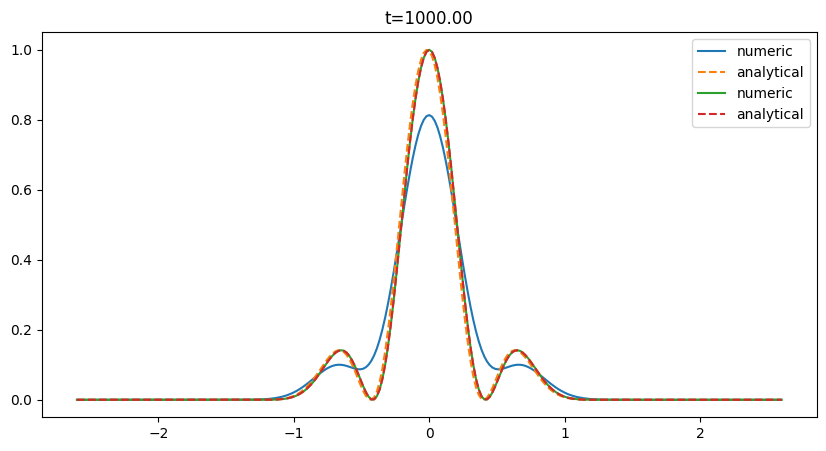

In [ ]:
def u_ana(xx,t,a):

    """Centered analytical solution"""

    dx = xx[1]-xx[0]
    padding = int(abs(t*a/dx))
    if a<0:
        x_pad = np.pad(xx, [padding,0],'reflect', reflect_type='odd')
        ana = u_x_t0(x_pad[:] - a*t)
        return ana[0:xx.shape[0]]
    elif a>0:
        x_pad = np.pad(xx, [0,padding],'reflect', reflect_type='odd')
        ana = u_x_t0(x_pad[:] - a*t)
        return ana[-xx.shape[0]:]

anat = np.zeros((nt,xx.shape[0]))
for i,t in enumerate(tt):
    anat[i] = u_ana(xx,t,-a)

nm.animMult([ut,anat],xx,["numeric","analytical"],["-","--"],tt)




Text(0.5, 1.0, 'Error of numerical at final time t = 1000.0')

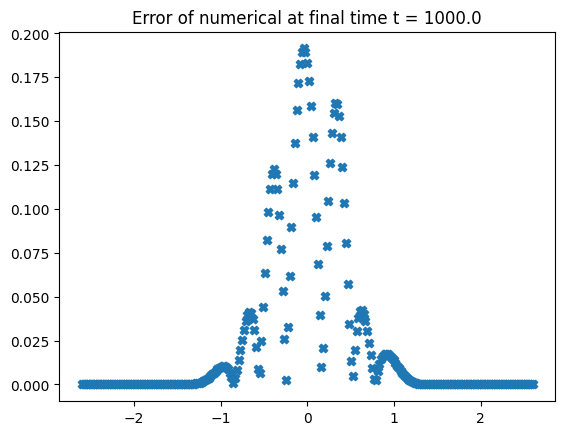

In [ ]:
plt.figure(2)
err = np.abs(ut[-1] - anat[-1])
plt.scatter(xx,err, marker = "X")
plt.title(f"Error of numerical at final time t = {tt[-1]}")

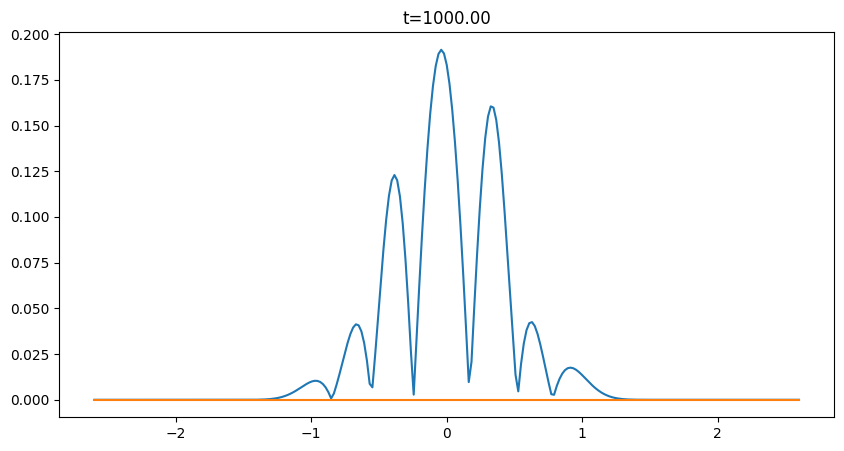

In [ ]:
errt = np.zeros((nt,xx.shape[0]))
for i,t in enumerate(tt):
    errt[i] = np.abs(anat[i]-ut[i])

nm.anim(errt,xx,tt)

1.001001001001001 0.020312500000000178
[0.00791743 4.41604649]


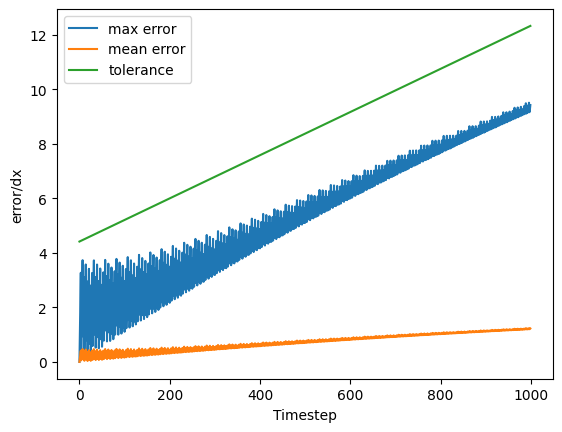

In [ ]:
max_err = [np.amax(err) for err in errt]
mean_err = [np.mean(err) for err in errt]

dx = xx[1]-xx[0]
dt = tt[1]-tt[0]
print(dt,dx)
plt.plot(tt/dt,max_err/(dx), label = "max error")
plt.plot(tt/dt,mean_err/(dx), label = "mean error")

plt.xlabel("Timestep")
plt.ylabel("error/dx")


coeff = np.polyfit(tt/dt,max_err/dx, deg = 1)
coeff[1] = 3*coeff[1]
func = np.polyval(coeff,tt/dt)
print(coeff)

plt.plot(tt/dt,func, label="tolerance")
plt.legend()

In [1]:
import numpy as np
import matplotlib.pyplot as plt
#import nm_lib as nm
import importlib
importlib.reload(nm)

def test_deriv_1sto(ddx,a, plot=False):

    #Random initial values
    x0 = -2.6
    xf = 2.6
    nump = 16*2**np.random.randint(0,5)
    xx = np.linspace(x0,xf,nump+1)
    Nt = 10**np.random.randint(1,4)
    #print(nump,Nt)

    print(f"Testing ddx = {ddx} | Nt = {Nt}, nump = {nump}")

    #Functions for analytical solution
    def u_x_t0(xx):
        return np.ma.cos(0.2*6*np.pi*xx)**2/np.cosh(5*xx*xx)
    
    def u_ana(xx,t,a):
        """Centered analytical solution"""
        dx = xx[1]-xx[0]
        padding = int(abs(t*a/dx))
        if a<0:
            x_pad = np.pad(xx, [padding,0],'reflect', reflect_type='odd')
            ana = u_x_t0(x_pad[:] - a*t)
            return ana[0:xx.shape[0]]
        elif a>0:
            x_pad = np.pad(xx, [0,padding],'reflect', reflect_type='odd')
            ana = u_x_t0(x_pad[:] - a*t)
            return ana[-xx.shape[0]:]

    u0 = u_x_t0(xx)
    tt, ut = nm.evolv_adv_burgers(xx,u0,Nt,a,keep_centered = a, bnd_limits = [0,1], ddx=nm.deriv_dnw)

    dx = xx[1]-xx[0]
    dt = tt[1]-tt[0]

    #print(dx,dt)
    
    #Analytical solution
    anat = np.zeros((Nt,xx.shape[0]))
    for i,t in enumerate(tt):
        anat[i] = u_ana(xx,t,a)


    #Error
    errt = np.zeros((Nt,xx.shape[0]))
    for i,t in enumerate(tt):
        errt[i] = np.abs(anat[i]-ut[i])

    max_err = [np.amax(err) for err in errt]
    mean_err = [np.mean(err) for err in errt]

    
    #Coefficients for error margin function
    coeff = [2*dx, 4.60205674]
    #print(coeff)
    func = np.polyval(coeff,tt/dt)

    
    if plot:
        plt.plot(tt/dt,max_err/(dx), label = "max error")
        plt.plot(tt/dt,mean_err/(dx), label = "mean error")
        plt.plot(tt/dt,func, label="tolerance")
        plt.legend()
        plt.xlabel("Timestep")
        plt.ylabel("error/dx")
    
    for fit, err in zip(func,max_err):
        if err > fit:
            print("Fail")
            return "failed test"
    print("passed")
        


for i in range(10):
    test_deriv_1sto(ddx = nm.deriv_upw, a = -1, plot = False  )

for i in range(10):
    test_deriv_1sto(ddx = nm.deriv_dnw, a = -1, plot = False  )



Testing ddx = <function deriv_upw at 0x7f80007a5700> | Nt = 10, nump = 16
passed
Testing ddx = <function deriv_upw at 0x7f80007a5700> | Nt = 10, nump = 32
passed
Testing ddx = <function deriv_upw at 0x7f80007a5700> | Nt = 10, nump = 128
passed
Testing ddx = <function deriv_upw at 0x7f80007a5700> | Nt = 100, nump = 128
passed
Testing ddx = <function deriv_upw at 0x7f80007a5700> | Nt = 100, nump = 256
passed
Testing ddx = <function deriv_upw at 0x7f80007a5700> | Nt = 10, nump = 64
passed
Testing ddx = <function deriv_upw at 0x7f80007a5700> | Nt = 100, nump = 128
passed
Testing ddx = <function deriv_upw at 0x7f80007a5700> | Nt = 100, nump = 32
passed
Testing ddx = <function deriv_upw at 0x7f80007a5700> | Nt = 1000, nump = 64


/var/folders/v1/8hk5yb957p70s6ch158zjzj40000gn/T/ipykernel_15293/1904876425.py:24: RuntimeWarning: overflow encountered in cosh
  return np.ma.cos(0.2*6*np.pi*xx)**2/np.cosh(5*xx*xx)


passed
Testing ddx = <function deriv_upw at 0x7f80007a5700> | Nt = 1000, nump = 32
passed
Testing ddx = <function deriv_dnw at 0x7f80007a5280> | Nt = 10, nump = 64
passed
Testing ddx = <function deriv_dnw at 0x7f80007a5280> | Nt = 10, nump = 16
passed
Testing ddx = <function deriv_dnw at 0x7f80007a5280> | Nt = 1000, nump = 32
passed
Testing ddx = <function deriv_dnw at 0x7f80007a5280> | Nt = 1000, nump = 64
passed
Testing ddx = <function deriv_dnw at 0x7f80007a5280> | Nt = 1000, nump = 64
passed
Testing ddx = <function deriv_dnw at 0x7f80007a5280> | Nt = 100, nump = 256
passed
Testing ddx = <function deriv_dnw at 0x7f80007a5280> | Nt = 100, nump = 256
passed
Testing ddx = <function deriv_dnw at 0x7f80007a5280> | Nt = 1000, nump = 32
passed
Testing ddx = <function deriv_dnw at 0x7f80007a5280> | Nt = 10, nump = 16
passed
Testing ddx = <function deriv_dnw at 0x7f80007a5280> | Nt = 10, nump = 256
passed


## 7 – Resolution increase in space and time. 

Let us repeat the calculation of the previous paragraphs, increasing the number of space intervals by factors of 2. Check if the numerical solution gets increasingly close to the analytical solution. Important: the comparison must be made _for the same values of $x$ and $t$ for all resolutions you check_. Choose a fixed time when the traveling function has already gone through the whole domain a few times. 

<span style="color:green">JMS </span>.
<span style="color:blue">Good job </span>.
<span style="color:orange">To be able to run the code I had to change to `from nm_lib import nm_lib as nm` </span>.